# Libraries& Whole Project

In [1]:
!pip install category_encoders


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")


from sklearn.preprocessing import StandardScaler, RobustScaler
import category_encoders as ce
from scipy.stats import chi2_contingency, ttest_ind
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix,roc_auc_score, roc_curve, auc,RocCurveDisplay
from sklearn.calibration import CalibrationDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.cluster import KMeans, DBSCAN
from scipy.cluster.hierarchy import linkage, dendrogram,fcluster
from sklearn.manifold import TSNE


import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model
from sklearn.decomposition import PCA
import joblib




## 1. Data Preprocessing

### 1.1 Data Info

In [3]:
df = pd.read_csv('cardio_train.csv', sep=';')

In [4]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [6]:
df.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,28851.302323,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,0.000000,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25006.750000,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50001.500000,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74889.250000,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [8]:
df['cholesterol'].value_counts()

cholesterol
1    52385
2     9549
3     8066
Name: count, dtype: int64

### 1.2 Handle Nulls & outliers & Duplicates

In [9]:
df.isna().sum()

id             0
age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

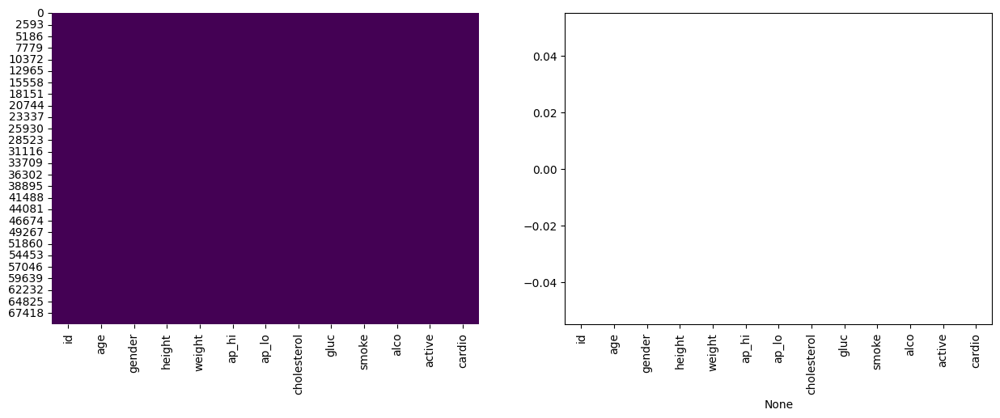

In [10]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

sns.heatmap(df.isna(), cbar=False, ax= ax[0], cmap='viridis')

missings = df.isna().sum()
sns.barplot(x=missings.index, y=missings.values, ax=ax[1])
ax[1].tick_params(axis='x', rotation=90)

plt.show()

In [11]:
df.duplicated().sum()

np.int64(0)

In [12]:
print("Initial dataset size:", df.shape)

Initial dataset size: (70000, 13)


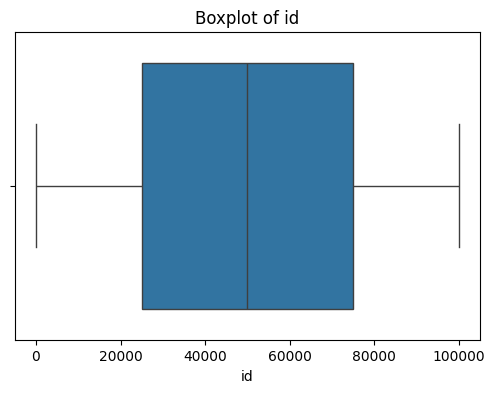

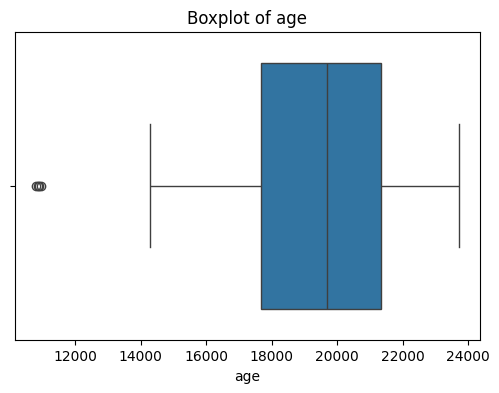

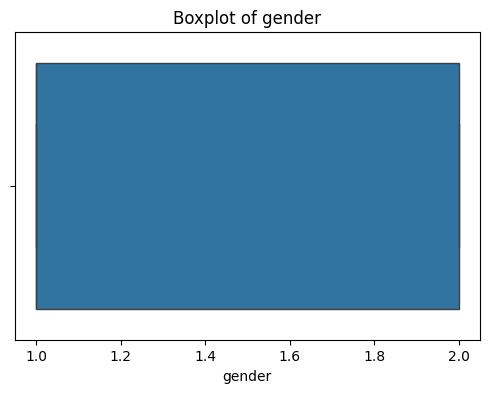

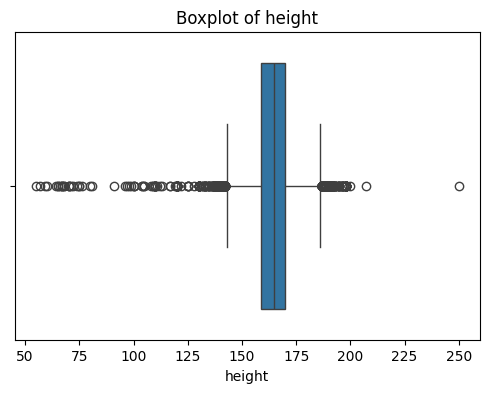

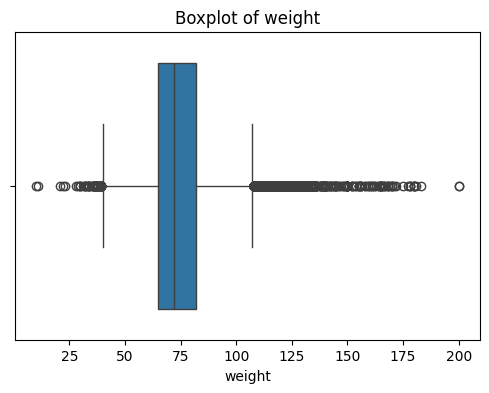

...

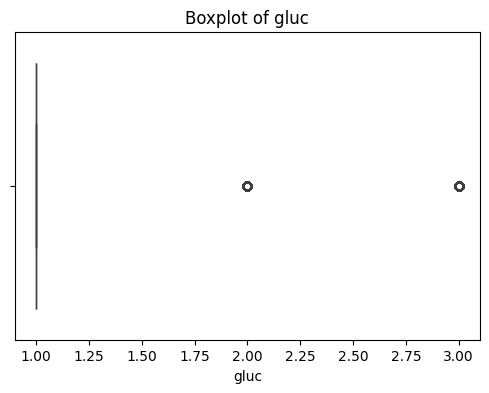

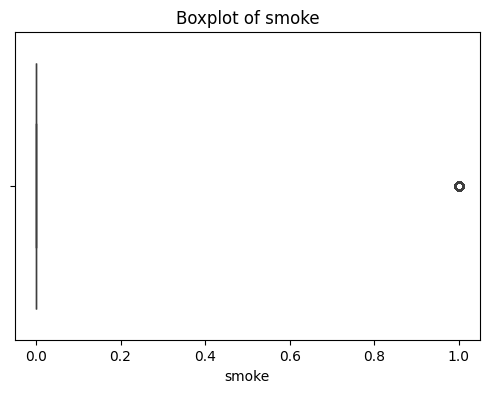

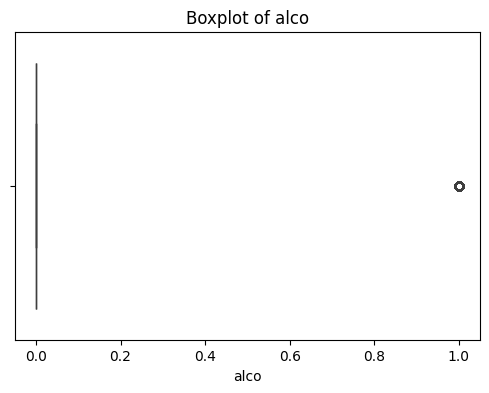

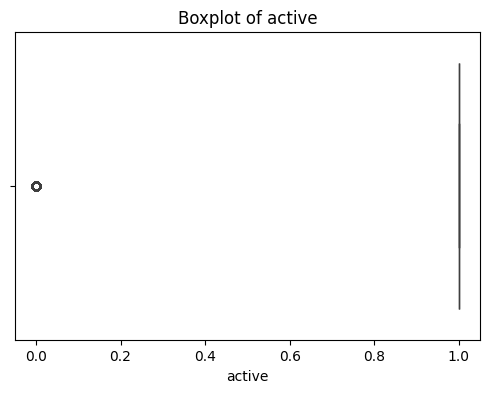

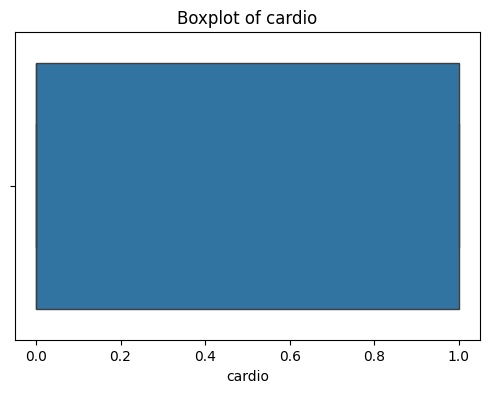

In [13]:
for col in df.columns:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

In [14]:
def clean_outliers(df):
    print("Initial dataset size:", df.shape)

    df_clean = df[(df['ap_hi'] <= 250) & (df['ap_lo'] <= 200)]
    print(f"Rows after removing extreme blood pressure values: {df_clean.shape[0]}")

    continuous_cols = ['age', 'height', 'weight', 'ap_hi', 'ap_lo']

    for col in continuous_cols:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        before_rows = df_clean.shape[0]
        df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]
        removed = before_rows - df_clean.shape[0]
        print(f"Removed {removed} rows from {col} using IQR")

    print("Dataset size after removing outliers:", df_clean.shape)
    return df_clean


In [15]:
df = clean_outliers(df)

Initial dataset size: (70000, 13)
Rows after removing extreme blood pressure values: 69007
Removed 4 rows from age using IQR
Removed 513 rows from height using IQR
Removed 1692 rows from weight using IQR
Removed 1145 rows from ap_hi using IQR
Removed 3151 rows from ap_lo using IQR
Dataset size after removing outliers: (62502, 13)


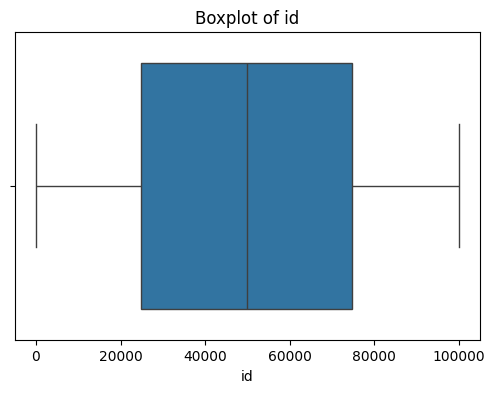

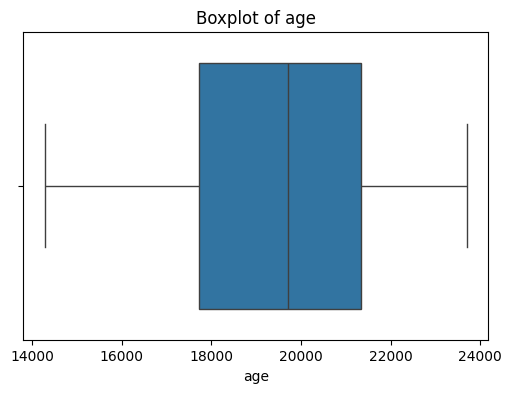

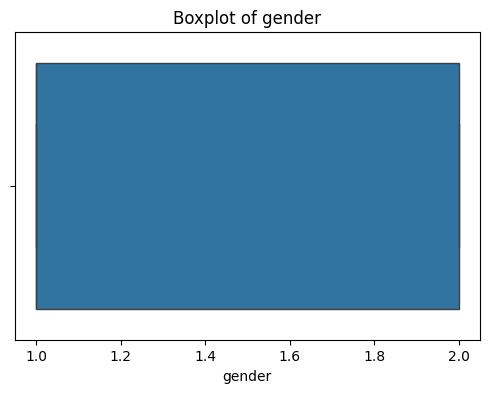

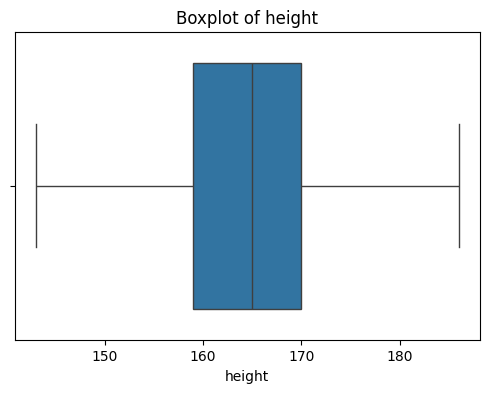

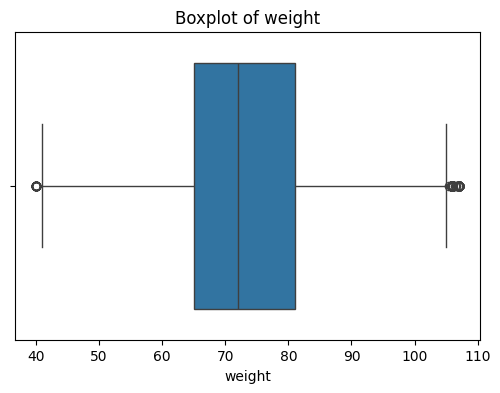

...

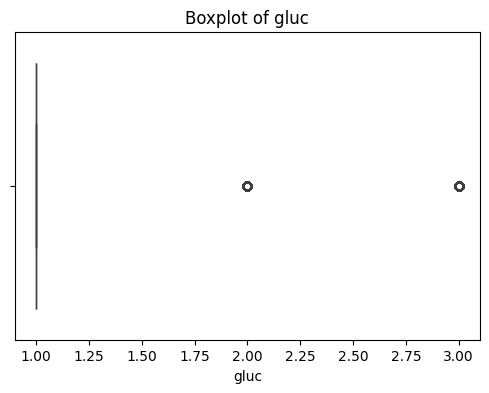

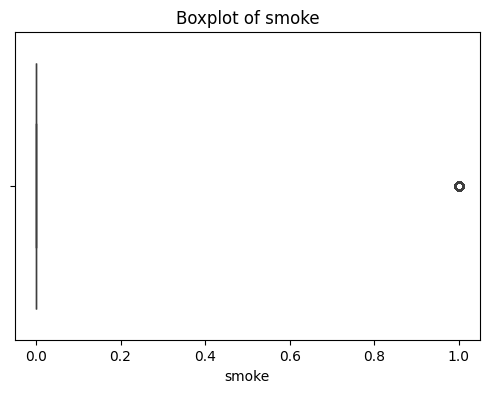

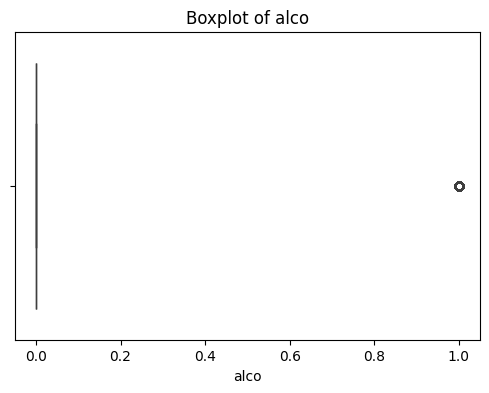

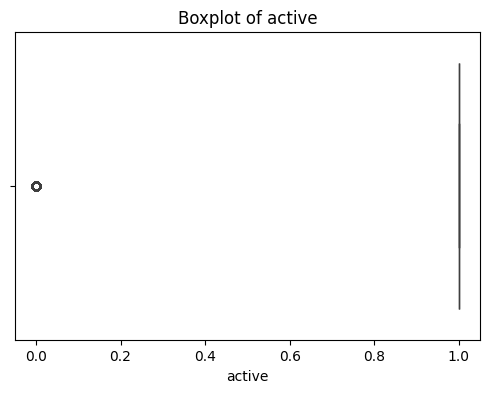

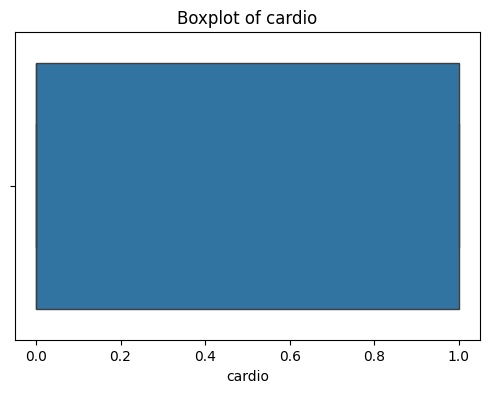

In [16]:
for col in df.columns:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

In [17]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
5,8,21914,1,151,67.0,120,80,2,2,0,0,0,0


### 1.3 Handle Class Imbalance

#### 1.3.1 Before Sampling

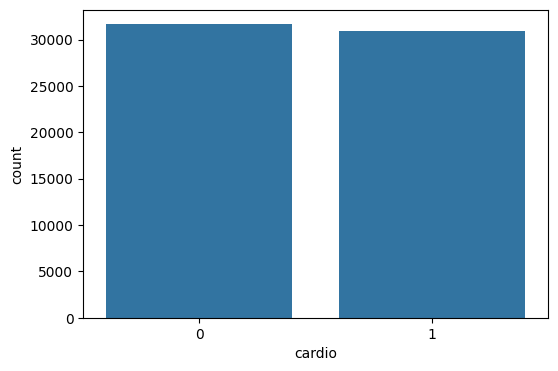

In [18]:
plt.figure(figsize=(6,4))
sns.countplot(x='cardio', data=df)
plt.show()

In [19]:
df['cardio'].value_counts()

cardio
0    31632
1    30870
Name: count, dtype: int64

#### 1.3.2 After using SMOTE

In [20]:
print(df['cardio'].isna().sum())

0


In [21]:
df = df.dropna(subset=['cardio'])

In [22]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
X = df.drop('cardio', axis=1)
y = df['cardio']
X_res, y_res = sm.fit_resample(X, y)
df_smote = pd.concat([X_res, y_res], axis=1)

print("Original dataset shape:", df['cardio'].value_counts().to_dict())
print("Resampled dataset shape:", df_smote['cardio'].value_counts().to_dict())

Original dataset shape: {0: 31632, 1: 30870}
Resampled dataset shape: {0: 31632, 1: 31632}


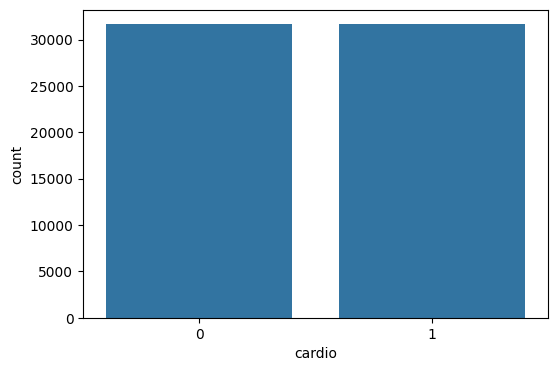

In [23]:
plt.figure(figsize=(6,4))
sns.countplot(x='cardio', data=df_smote)
plt.show()

In [24]:
df_smote.duplicated().sum()

np.int64(0)

#### 1.3.3 Try using RAndomOverSampling

In [25]:
from imblearn.over_sampling import RandomOverSampler

rm = RandomOverSampler()
X = df.drop('cardio', axis=1)
y = df['cardio']
X_res, y_res = rm.fit_resample(X, y)
df_rnd = pd.concat([X_res, y_res], axis=1)
print("Original dataset shape:", df['cardio'].value_counts().to_dict())
print("Resampled dataset shape:", df_rnd['cardio'].value_counts().to_dict())

Original dataset shape: {0: 31632, 1: 30870}
Resampled dataset shape: {0: 31632, 1: 31632}


In [26]:
df_rnd.duplicated().sum()

np.int64(762)

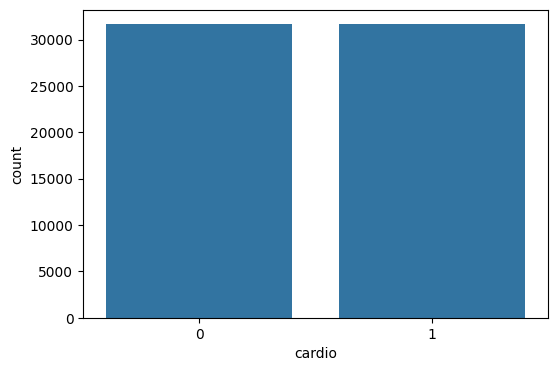

In [27]:
plt.figure(figsize=(6,4))
sns.countplot(x='cardio', data=df_rnd)
plt.show()

#### 1.3.4 Statistics before Sampling

In [28]:
print("statistics before sampling")
df.describe()

statistics before sampling


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000,62502.000000
mean,49941.878468,19493.750360,1.348581,164.406131,73.181456,126.420339,81.699146,1.357717,1.220649,0.086349,0.052174,0.804310,0.493904
std,28864.471866,2458.088341,0.476525,7.531374,12.271998,14.289980,7.673399,0.675203,0.567601,0.280881,0.222380,0.396734,0.499967
min,0.000000,14282.000000,1.000000,143.000000,40.000000,90.000000,65.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,24876.500000,17724.250000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,49980.500000,19718.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74848.750000,21341.750000,2.000000,170.000000,81.000000,140.000000,90.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,186.000000,107.000000,170.000000,105.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


#### 1.3.5 statistics after smote sampling

In [29]:
print("statistics after smote sampling")
df_smote.describe()


statistics after smote sampling


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000
mean,49918.443949,19500.318301,1.345916,164.393937,73.213602,126.496791,81.727143,1.356380,1.219414,0.085404,0.051578,0.802447,0.500000
std,28869.592599,2458.134518,0.475670,7.520753,12.256885,14.285386,7.665938,0.673322,0.565646,0.279484,0.221174,0.398156,0.500004
min,0.000000,14282.000000,1.000000,143.000000,40.000000,90.000000,65.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,24840.750000,17738.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,49942.000000,19721.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.500000
75%,74833.500000,21351.000000,2.000000,170.000000,81.000000,140.000000,90.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,186.000000,107.000000,170.000000,105.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


#### 1.3.5 Statistics afetr random sampling

In [30]:
print("Statistics afetr random sampling")
df_rnd.describe()

Statistics afetr random sampling


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000,63264.000000
mean,49967.297468,19500.816215,1.348666,164.405428,73.202146,126.491607,81.729182,1.360015,1.221374,0.086179,0.052068,0.803538,0.500000
std,28861.663483,2457.133665,0.476552,7.532278,12.273878,14.303448,7.683759,0.676965,0.568508,0.280630,0.222165,0.397325,0.500004
min,0.000000,14282.000000,1.000000,143.000000,40.000000,90.000000,65.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,24902.500000,17739.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50020.500000,19721.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.500000
75%,74878.250000,21350.000000,2.000000,170.000000,81.000000,140.000000,90.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,186.000000,107.000000,170.000000,105.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


### Conclusion of using methods of sampling:

Based on the preprocessing statistics and duplicate analysis before fitting any model, we can clearly conclude the following:

1. Random Oversampling

It works by simply repeating existing minority samples.

This causes a very high number of duplicates (762 duplicated rows found).

Such repetition can easily lead to overfitting, because the model will memorize repeated samples instead of learning general patterns.

2. SMOTE

SMOTE generates new synthetic samples based on interpolation between minority class neighbors.

The number of duplicates is zero, meaning:

The synthetic data is new, not copied.

It increases the diversity of the minority class.

It helps the model learn better decision boundaries.

### 1.4 Encoding

In [31]:
df_smote.dtypes

id               int64
age              int64
gender           int64
height           int64
weight         float64
ap_hi            int64
ap_lo            int64
cholesterol      int64
gluc             int64
smoke            int64
alco             int64
active           int64
cardio           int64
dtype: object

In [32]:
df_smote['cholesterol'].value_counts()

cholesterol
1    47803
2     8376
3     7085
Name: count, dtype: int64

In [33]:
df_smote['gluc'].value_counts()

gluc
1    54086
3     4703
2     4475
Name: count, dtype: int64

#### 1.4.1 Ordinal Encoder

In [34]:
ordinal_encoder= ce.OrdinalEncoder(cols=['cholesterol','gluc'],
                                  return_df=True,
                                   mapping=[
                                       {'col':'cholesterol','mapping':{1:0, 2:1, 3:2}}
                                   ])

In [35]:
ordinal_encoder

,verbose,0
,mapping,"[{'col': 'cholesterol', 'data_type': dtype('int64'), 'mapping': 1 0 2 1...2 dtype: int64}]"
,cols,"['cholesterol', 'gluc']"
,drop_invariant,False
,return_df,True
,handle_unknown,'value'
,handle_missing,'value'


In [36]:
df_encoded = ordinal_encoder.fit_transform(df_smote)

In [37]:
df_encoded[['cholesterol']].head()

,cholesterol
0,0
1,2
2,2
3,0
4,1


In [38]:
df_encoded.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,0,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,2,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,2,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,0,1,0,0,1,1
4,8,21914,1,151,67.0,120,80,1,2,0,0,0,0


In [39]:
df_encoded.drop('id', axis=1, inplace=True)

In [40]:

joblib.dump(ordinal_encoder, "ordinal_encoder.pkl")

['ordinal_encoder.pkl']

## 2. Exploratory Data Analysis (EDA)

### 2.1 correlation analysis

In [41]:
df_encoded.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,18393,2,168,62.0,110,80,0,1,0,0,1,0
1,20228,1,156,85.0,140,90,2,1,0,0,1,1
2,18857,1,165,64.0,130,70,2,1,0,0,0,1
3,17623,2,169,82.0,150,100,0,1,0,0,1,1
4,21914,1,151,67.0,120,80,1,2,0,0,0,0


In [42]:
features = ['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
            'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio']

corr = df_encoded[features].corr()
print(corr['cardio'].sort_values(ascending=False))


cardio         1.000000
ap_hi          0.432467
ap_lo          0.336179
age            0.236292
cholesterol    0.214195
weight         0.162581
gluc           0.082801
gender        -0.010368
alco          -0.014937
smoke         -0.025394
height        -0.028920
active        -0.041765
Name: cardio, dtype: float64



### 2.2 heatmap visualization

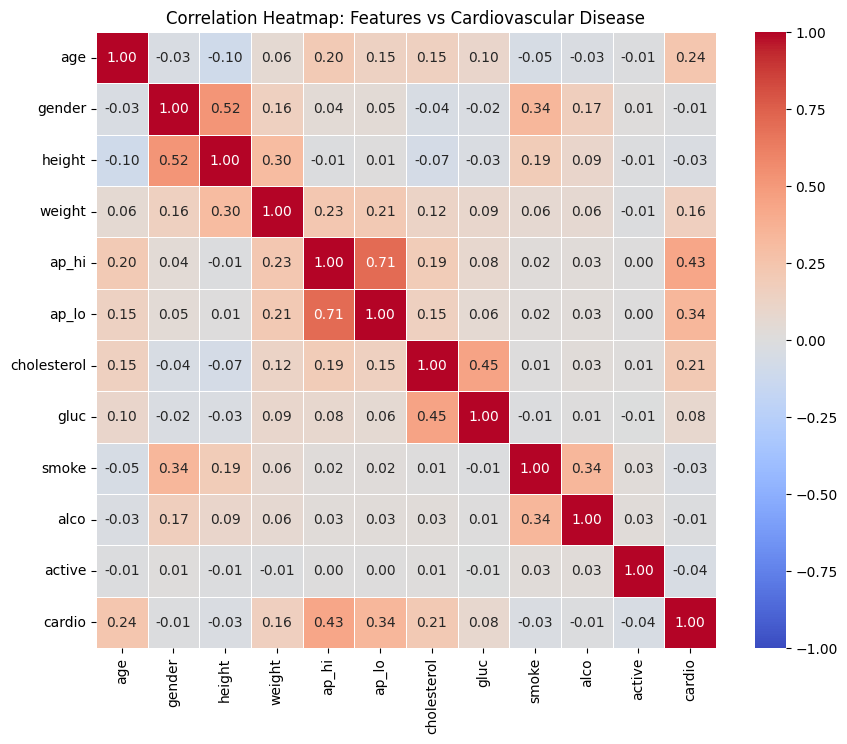

In [43]:
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm',
            vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Heatmap: Features vs Cardiovascular Disease')
plt.show()


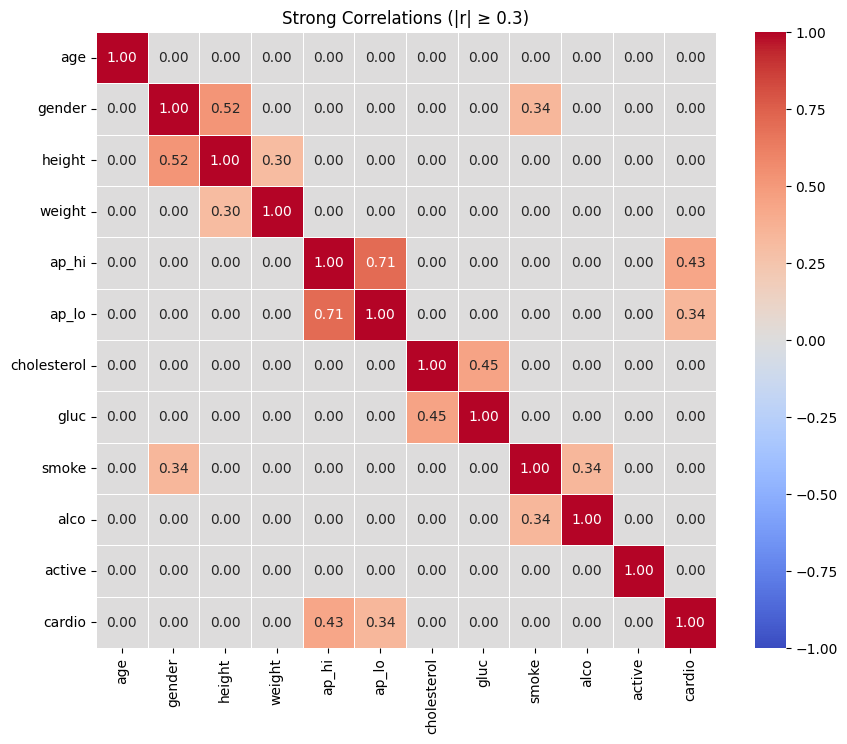

In [44]:
strong_corr = corr.copy()
strong_corr[(strong_corr < 0.3) & (strong_corr > -0.3)] = 0

plt.figure(figsize=(10, 8))
sns.heatmap(strong_corr, annot=True, fmt=".2f", cmap='coolwarm',
            vmin=-1, vmax=1, linewidths=0.5)
plt.title('Strong Correlations (|r| ≥ 0.3)')
plt.show()


### 2.3  age distribution analysis (5-year bins).

In [45]:
df_encoded["real_age"] = df_encoded["age"] / 365
bins = np.arange(0, df_encoded['real_age'].max() + 5, 5)

fig = px.histogram(
    df_encoded,
    x='real_age',
    nbins=len(bins),
    title='Age Distribution (5-year bins)'
)

fig.update_traces(marker_line_width=1, marker_line_color="black")
fig.update_layout(xaxis_title="Age (5-year bins)", yaxis_title="Count")

fig.show()


### 2.4 Visualize disease prevalence across different age groups.

In [46]:
bins = np.arange(0, df_encoded['real_age'].max() + 5, 5)
df_encoded['age_group'] = pd.cut(df_encoded['real_age'], bins=bins)

prevalence = df_encoded.groupby('age_group')['cardio'].mean() * 100

fig = px.bar(
    x=prevalence.index.astype(str),
    y=prevalence.values,
    title="Disease prevalence across different age groups (5-year bins)",
    labels={'x': 'Age Group', 'y': 'Disease Prevalence (%)'}
)

fig.update_traces(marker_line_width=1, marker_line_color="black")
fig.show()


### 2.5 Create blood pressure category visualizations (normal, stage 1, stage 2 hypertension).

In [47]:
df = df_encoded

In [48]:
conditions=[
    (df['ap_hi']<120)&(df['ap_lo']<80),
    (df['ap_hi']>=120)&(df['ap_hi']<140)|(df['ap_lo']>=80)&(df['ap_lo']<100),
    (df['ap_hi']>=140)|(df['ap_lo']>=100)
]

values = ['normal', 'stage 1', 'stage 2']

In [49]:

df['bp_category'] = np.select(conditions, values, default=None).astype(object)

In [50]:
df['bp_category'].value_counts()

bp_category
stage 1    52329
normal      7285
stage 2     3650
Name: count, dtype: int64

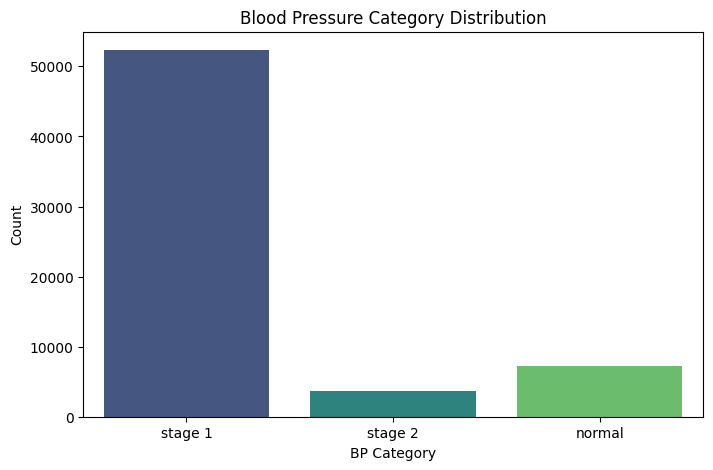

In [51]:
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='bp_category', palette='viridis')
plt.title("Blood Pressure Category Distribution")
plt.xlabel("BP Category")
plt.ylabel("Count")
plt.show()


In [52]:
prevalence = df.groupby('bp_category')['cardio'].mean() * 100
prevalence


bp_category
normal     23.404255
stage 1    51.340557
stage 2    83.863014
Name: cardio, dtype: float64

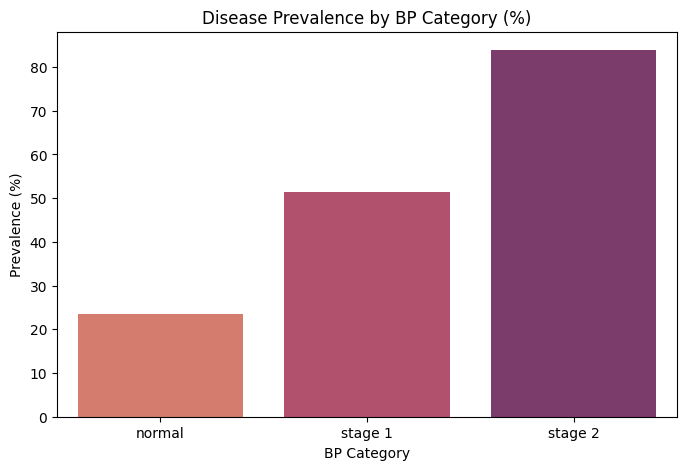

In [53]:
plt.figure(figsize=(8,5))
sns.barplot(x=prevalence.index, y=prevalence.values, palette='flare')
plt.title("Disease Prevalence by BP Category (%)")
plt.ylabel("Prevalence (%)")
plt.xlabel("BP Category")
plt.show()


### 2.6 Interpretation

We observe a clear pattern between blood pressure level and cardiovascular disease.

- Individuals with **normal blood pressure** show the lowest disease prevalence.
- **Stage 1 hypertension** shows a noticeably higher prevalence.
- **Stage 2 hypertension** shows the highest cardiovascular disease risk.

This indicates a strong positive relationship between blood pressure severity and cardiovascular disease. As blood pressure increases, the likelihood of having cardiovascular disease rises significantly.


### 2.7 Build interactive Plotly dashboards combining key risk factors

In [54]:
df['age_years'] = (df['age'] / 365).astype(int)

fig = px.scatter(
    df,
    x='age_years',
    y='ap_hi',
    color='cardio',
    size='weight',
    hover_data=['ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'bp_category'],
    facet_col='bp_category',
    title='Cardiovascular Disease Risk Factor Combinations'
)

fig.show()



### 2.8 Perform statistical significance tests (chi-square & t-test) for demographic groups.

#### 2.8.1 Chi_square

In [55]:
contingency_table = pd.crosstab(df['gender'], df['cardio'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print("Chi-square test p-value:", p)

Chi-square test p-value: 0.009337548094691672


In [56]:
bp_disease = df[df['cardio']==1]['ap_hi']
bp_healthy = df[df['cardio']==0]['ap_hi']
t_stat, p = ttest_ind(bp_disease, bp_healthy)
print("T-test p-value:", p)

T-test p-value: 0.0


Statistical Analysis Summary

Chi-square Test: Gender is significantly associated with cardiovascular disease (p = 0.0107), suggesting it as a relevant risk factor.

T-test: Systolic blood pressure (ap_hi) is significantly higher in patients with cardiovascular disease (p ≈0) , confirming it is important

### 2.9 Scaling & Splitting


In [57]:
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,real_age,age_group,bp_category,age_years
0,18393,2,168,62.0,110,80,0,1,0,0,1,0,50.391781,"(50.0, 55.0]",stage 1,50
1,20228,1,156,85.0,140,90,2,1,0,0,1,1,55.419178,"(55.0, 60.0]",stage 1,55
2,18857,1,165,64.0,130,70,2,1,0,0,0,1,51.663014,"(50.0, 55.0]",stage 1,51
3,17623,2,169,82.0,150,100,0,1,0,0,1,1,48.282192,"(45.0, 50.0]",stage 2,48
4,21914,1,151,67.0,120,80,1,2,0,0,0,0,60.038356,"(60.0, 65.0]",stage 1,60


In [58]:
df.drop(columns=['real_age', 'age_group', 'bp_category', 'age_years'], inplace=True)


In [59]:
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,18393,2,168,62.0,110,80,0,1,0,0,1,0
1,20228,1,156,85.0,140,90,2,1,0,0,1,1
2,18857,1,165,64.0,130,70,2,1,0,0,0,1
3,17623,2,169,82.0,150,100,0,1,0,0,1,1
4,21914,1,151,67.0,120,80,1,2,0,0,0,0



#### 2.9.1 Create temporal splits to prevent data leakage by year.

In [60]:
df['year'] = (df['age'] / 365).astype(int)

In [61]:
df = df.sort_values(by='year')

In [62]:
df.cholesterol.value_counts()

cholesterol
0    47803
1     8376
2     7085
Name: count, dtype: int64

In [63]:
split_index = int(len(df) * 0.8)

In [64]:
train = df.iloc[:split_index]
test = df.iloc[split_index:]

In [65]:
train.shape

(50611, 13)

In [66]:
test.shape

(12653, 13)

#### 2.9.2 Using RobustScalaer

In [67]:
numerical_cols = ['age', 'height', 'weight']
scaler = RobustScaler()
train[numerical_cols] = scaler.fit_transform(train[numerical_cols])
test[numerical_cols] = scaler.transform(test[numerical_cols])

In [68]:
train.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,year
60657,-1.442807,1,0.0,-0.133333,120,80,0,1,0,0,1,0,39
21787,-1.472925,2,1.7,-0.800000,100,69,0,1,0,0,1,0,39
5857,-1.483819,1,-0.1,-0.133333,120,80,0,1,0,0,1,0,39
5865,-1.496956,1,-1.5,-0.266667,110,70,0,1,0,0,1,0,39
5867,-1.442166,1,0.4,-0.733333,130,70,1,1,0,0,1,1,39


In [69]:

joblib.dump(scaler, "scaler.pkl")

['scaler.pkl']

## Split Train and Test

In [70]:
target_col = 'cardio'

x_train = train.drop(columns=[target_col])
y_train = train[target_col]

x_test = test.drop(columns=[target_col])
y_test = test[target_col]

In [71]:
print("X_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (50611, 12)
y_train shape: (50611,)
X_test shape: (12653, 12)
y_test shape: (12653,)


## 3. Supervised Models

### 3.1 XGBOOST

In [72]:
model_xgbt = XGBClassifier(
    n_estimators=500,
    max_depth=8,
    learning_rate=0.02,
    random_state=42
)

model_xgbt.fit(x_train, y_train)

,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [73]:
y_pred = model_xgbt.predict(x_test)

In [74]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6905081798782897


In [75]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.52      0.53      4200
           1       0.77      0.77      0.77      8453

    accuracy                           0.69     12653
   macro avg       0.65      0.65      0.65     12653
weighted avg       0.69      0.69      0.69     12653



In [76]:
importance_df = pd.DataFrame({
    "Feature": x_train.columns,
    "Importance": model_xgbt.feature_importances_
}).sort_values(by="Importance", ascending=False)

print("\nFeature Importance:")
print(importance_df)


Feature Importance:
        Feature  Importance
4         ap_hi    0.541463
6   cholesterol    0.136873
11         year    0.065074
0           age    0.035266
7          gluc    0.032768
10       active    0.032648
8         smoke    0.031009
9          alco    0.030652
5         ap_lo    0.026539
3        weight    0.023532
1        gender    0.023497
2        height    0.020678


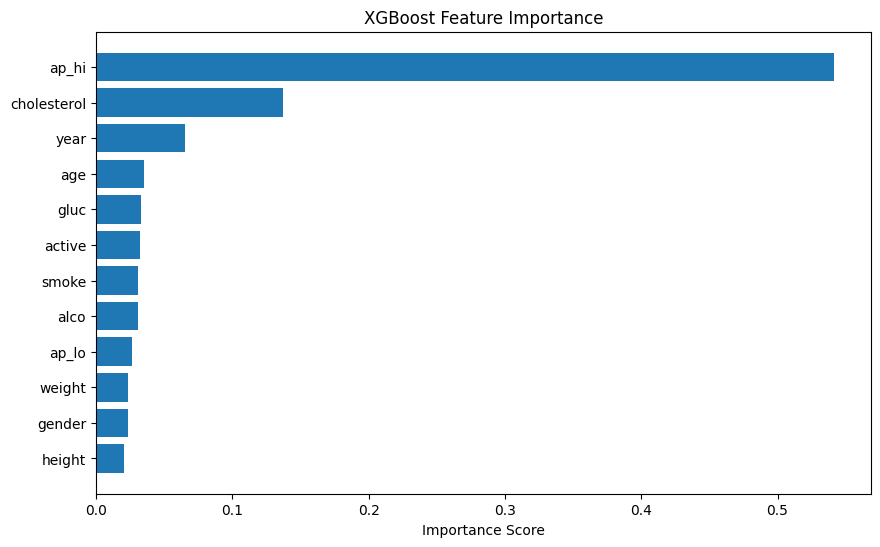

In [77]:
# Plot feature importance
plt.figure(figsize=(10,6))
plt.barh(importance_df["Feature"], importance_df["Importance"])
plt.gca().invert_yaxis()
plt.title("XGBoost Feature Importance")
plt.xlabel("Importance Score")
plt.show()

In [78]:
joblib.dump(model_xgbt, "model_xgbt.pkl")

['model_xgbt.pkl']

### 3.2 RandomForest

In [79]:
rf = RandomForestClassifier(
    n_estimators=1200,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42

)
rf.fit(x_train, y_train)
y_t_pred = rf.predict(x_train)
y_pred = rf.predict(x_test)

print("train predict", accuracy_score(y_train, y_t_pred)*100,'%')
print("test predict", accuracy_score(y_test, y_pred)*100,'%')


train predict 99.96838631917963 %
test predict 65.80257646407966 %


In [80]:
joblib.dump(rf , "rf_model.pkl")

['rf_model.pkl']

as all models give us a vry low accuarcy we think about spliting the data itself into 3 or 4 parts and train each on the models

In [81]:
X1, X_rest, y1, y_rest = train_test_split(x_train, y_train, test_size=0.75, random_state=42)
X2, X_rest, y2, y_rest = train_test_split(X_rest, y_rest, test_size=0.66, random_state=42)
X3, X4, y3, y4 = train_test_split(X_rest, y_rest, test_size=0.50, random_state=42)
X5, X6, y5, y6 = train_test_split(X_rest, y_rest, test_size=0.4, random_state=42)


In [82]:
models = []

for Xi, yi in [(X1, y1), (X2, y2), (X3, y3), (X4, y4),(X5,y5),(X6,y6)]:
    model = RandomForestClassifier(
        n_estimators=2500,
        max_depth=None,
        min_samples_leaf=2,
        min_samples_split=2,
        random_state=42
    )
    model.fit(Xi, yi)
    models.append(model)
    y_pred = model.predict(x_test)
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))

Accuracy: 0.6685371058247056
              precision    recall  f1-score   support

           0       0.50      0.44      0.47      4200
           1       0.74      0.78      0.76      8453

    accuracy                           0.67     12653
   macro avg       0.62      0.61      0.61     12653
weighted avg       0.66      0.67      0.66     12653

Accuracy: 0.6795226428514977
              precision    recall  f1-score   support

           0       0.55      0.18      0.27      4200
           1       0.70      0.93      0.79      8453

    accuracy                           0.68     12653
   macro avg       0.62      0.55      0.53     12653
weighted avg       0.65      0.68      0.62     12653

Accuracy: 0.6738322927369004
              precision    recall  f1-score   support

           0       0.51      0.58      0.54      4200
           1       0.78      0.72      0.75      8453

    accuracy                           0.67     12653
   macro avg       0.64      0.65      0.

In [83]:
preds = []

for model in models:
    preds.append(model.predict(x_test))


preds = np.array(preds)

# Majority Vote
from scipy.stats import mode
final_pred, _ = mode(preds, axis=0)
final_pred = final_pred.flatten()

In [84]:
print("Final Accuracy:", accuracy_score(y_test, final_pred))

Final Accuracy: 0.6895597881925235


In [85]:
joblib.dump(models, "rf2_model.pkl")

['rf2_model.pkl']

In [86]:
importance_df = pd.DataFrame({
    "Feature": x_train.columns,
    "Importance": rf.feature_importances_
}).sort_values(by="Importance", ascending=False)

print("\nFeature Importance:")
print(importance_df)


Feature Importance:
        Feature  Importance
0           age    0.250446
4         ap_hi    0.176129
3        weight    0.167721
2        height    0.152989
5         ap_lo    0.085393
11         year    0.065449
6   cholesterol    0.036664
1        gender    0.017432
7          gluc    0.016936
10       active    0.013785
8         smoke    0.009249
9          alco    0.007808


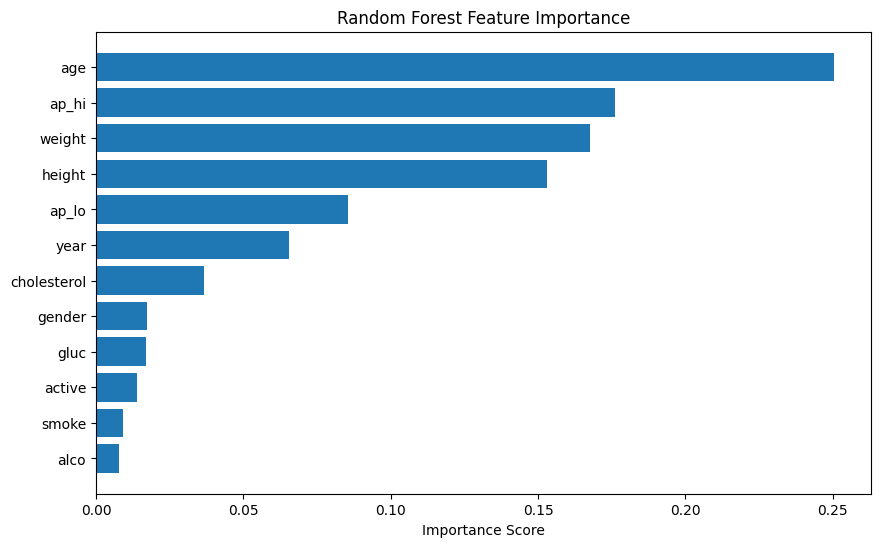

In [87]:
# Plot feature importance
plt.figure(figsize=(10,6))
plt.barh(importance_df["Feature"], importance_df["Importance"])
plt.gca().invert_yaxis()
plt.title("Random Forest Feature Importance")
plt.xlabel("Importance Score")
plt.show()

1. there are a difference between xgboost feature importance and random forest as the most *important fearture was a aphi in xgboost on the other hand it is the second in the random fogrest*

2. the accuracy in xgboost although more great than the random forest which reach at most to 68.8 %

### 3.3  Logistic Regression

In [88]:
df.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio', 'year'],
      dtype='object')

In [89]:
Scaler = StandardScaler()

x_train[numerical_cols] = Scaler.fit_transform(x_train[numerical_cols])
x_test[numerical_cols] = Scaler.transform(x_test[numerical_cols])

In [90]:
lg_model=LogisticRegression(penalty='l2',class_weight='balanced',C=0.5,random_state=42)
lg_model.fit(x_train,y_train)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,0.5
,fit_intercept,True
,intercept_scaling,1
,class_weight,'balanced'
,random_state,42
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [91]:
y_pred = lg_model.predict(x_test)
y_prob = lg_model.predict_proba(x_test)[:,1]

In [92]:
print("Accuracy:", accuracy_score(y_test, y_pred)*100)

Accuracy: 69.56453015095234


In [93]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.55      0.46      0.50      4200
           1       0.75      0.81      0.78      8453

    accuracy                           0.70     12653
   macro avg       0.65      0.64      0.64     12653
weighted avg       0.69      0.70      0.69     12653



In [94]:
print("AUC:", roc_auc_score(y_test, y_prob)*100)

AUC: 71.3463816734549


In [95]:
print("Confusion Matrix:",confusion_matrix(y_test, y_pred))

Confusion Matrix: [[1951 2249]
 [1602 6851]]


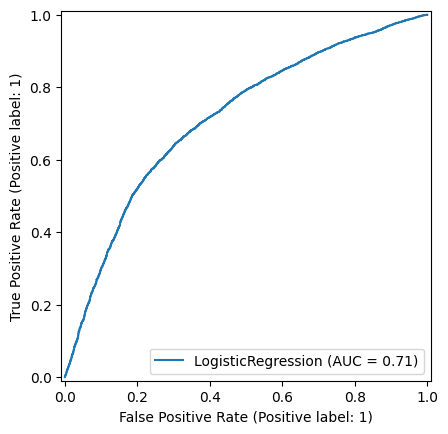

In [98]:
RocCurveDisplay.from_estimator(lg_model, x_test, y_test)
plt.show()

In [99]:
coef = pd.Series(lg_model.coef_[0], index=x_train.columns)
coef_sorted = coef.sort_values()

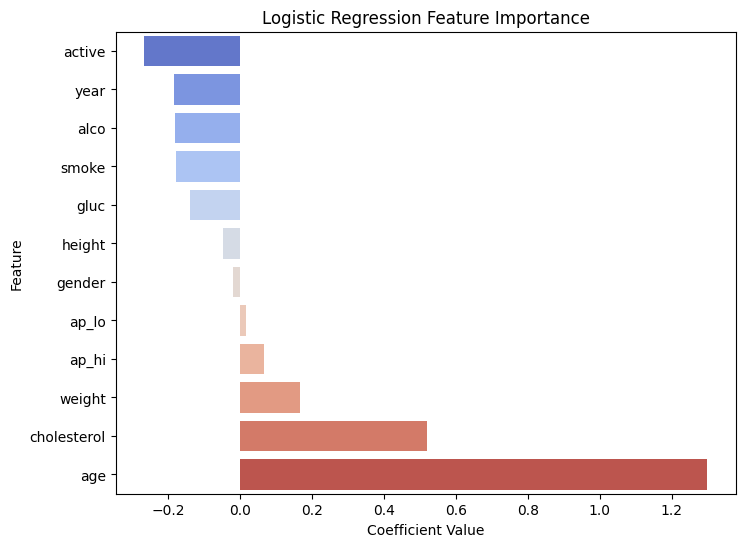

In [100]:
plt.figure(figsize=(8,6))
sns.barplot(x=coef_sorted.values, y=coef_sorted.index, palette="coolwarm")
plt.title("Logistic Regression Feature Importance")
plt.xlabel("Coefficient Value")
plt.ylabel("Feature")
plt.show()

In [101]:

joblib.dump(lg_model, "lg_model.pkl")

['lg_model.pkl']

### 3.4 stratified 5-fold cross-validation with AUC-ROC scores.

In [102]:
rd_model = RandomForestClassifier(random_state=42)

In [103]:

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
auc_scores = []

In [104]:
for train_index, test_index in skf.split(x_train, y_train):
    X_fold_train, X_fold_test = x_train.iloc[train_index], x_train.iloc[test_index]
    y_fold_train, y_fold_test = y_train.iloc[train_index], y_train.iloc[test_index]


    rd_model.fit(X_fold_train, y_fold_train)
    y_pred_prob = rd_model.predict_proba(X_fold_test)[:,1]


    auc_score = roc_auc_score(y_fold_test, y_pred_prob)
    auc_scores.append(auc_score)

In [105]:

print("AUC-ROC scores for each fold:", auc_scores)
print("Mean AUC-ROC score across folds:", np.mean(auc_scores))

AUC-ROC scores for each fold: [0.7661097695344853, 0.7663966157922748, 0.7630777825869097, 0.7691395495066742, 0.7764456399645564]
Mean AUC-ROC score across folds: 0.76823387147698


### 3.5 calibration curves

In [106]:
rd_model.fit(x_train, y_train)
y_pred_prob_full = rd_model.predict_proba(x_test)[:, 1]

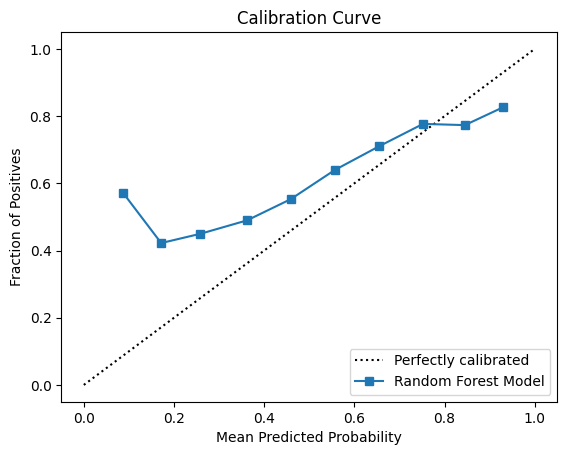

In [107]:
CalibrationDisplay.from_predictions(y_test, y_pred_prob_full, n_bins=10,
                                    name='Random Forest Model',
                                    )
plt.title('Calibration Curve')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.show()

In [108]:
joblib.dump(rd_model, "random_model.pkl")

['random_model.pkl']

## 4. Unsupervised Models

### 4.1 Kmeans Clustering

In [109]:
from sklearn.cluster import KMeans

features = ['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
            'cholesterol', 'gluc', 'smoke', 'alco', 'active']

numerical_cols = ['age', 'height', 'weight', 'ap_hi', 'ap_lo']
scaler = StandardScaler()
# df_scaled = df.copy()
# df_scaled[numerical_cols] = scaler.fit_transform(df_scaled[numerical_cols])

# KMeans clustering
kmeans = KMeans(n_clusters=6, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[features])

# Profiling Cluster
profiles = {}
for c in sorted(df['Cluster'].unique()):
    cluster_df = df[df['Cluster'] == c]
    stats = {}
    for col in features:
        stats[f'{col}_mean'] = cluster_df[col].mean()
        stats[f'{col}_median'] = cluster_df[col].median()
        stats[f'{col}_std'] = cluster_df[col].std()
        stats[f'{col}_min'] = cluster_df[col].min()
        stats[f'{col}_max'] = cluster_df[col].max()
        if cluster_df[col].nunique() <= 5:
            stats[f'{col}_percentage'] = cluster_df[col].mean() * 100
    # Profile target
    stats['cardio_mean'] = cluster_df['cardio'].mean()
    stats['count'] = len(cluster_df)
    stats['percentage_of_dataset'] = (len(cluster_df) / len(df)) * 100
    profiles[f'Cluster_{c}'] = stats

profiles_df = pd.DataFrame(profiles).T
profiles_df


,age_mean,age_median,age_std,age_min,age_max,gender_mean,gender_median,gender_std,gender_min,gender_max,...,alco_percentage,active_mean,active_median,active_std,active_min,active_max,active_percentage,cardio_mean,count,percentage_of_dataset
Cluster_0,19362.937750,19490.0,388.284159,18666.0,20081.0,1.326147,1.0,0.468820,1.0,2.0,...,5.056840,0.800862,1.0,0.399367,0.0,1.0,80.086241,0.478949,12755.0,20.161545
Cluster_1,22554.858749,22553.0,607.846563,21683.0,23713.0,1.342826,1.0,0.474670,1.0,2.0,...,4.207904,0.794116,1.0,0.404360,0.0,1.0,79.411567,0.660136,14853.0,23.477807
Cluster_2,14948.629043,14934.5,381.283886,14282.0,15680.0,1.389993,1.0,0.487790,1.0,2.0,...,6.098383,0.798686,1.0,0.401016,0.0,1.0,79.868598,0.266509,5936.0,9.382903
Cluster_3,20812.354354,20864.0,408.767508,20107.0,21682.0,1.325743,1.0,0.468669,1.0,2.0,...,5.101817,0.805270,1.0,0.396007,0.0,1.0,80.526969,0.551566,13701.0,21.656866
Cluster_4,16412.753841,16528.0,387.529191,15688.0,17155.0,1.389570,1.0,0.487691,1.0,2.0,...,6.223809,0.821201,1.0,0.383213,0.0,1.0,82.120130,0.383362,6443.0,10.184307
Cluster_5,17967.214599,18121.0,384.294547,17196.0,18663.0,1.349206,1.0,0.476744,1.0,2.0,...,5.545113,0.803154,1.0,0.397636,0.0,1.0,80.315372,0.429094,9576.0,15.136571


In [110]:
joblib.dump(kmeans, "kmeans_model.pkl")

['kmeans_model.pkl']

4.2 DBSCAN

In [111]:

best_eps = 2.5

dbscan = DBSCAN(eps=best_eps, min_samples=3)

labels = dbscan.fit_predict(df[features])


print("Unique DBSCAN Labels:", np.unique(labels))
# Add the labels column to the dataframe
df["DBSCAN_Label"] = labels



Unique DBSCAN Labels: [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232
 233 234 235 236 237 238 239 

In [112]:
outliers_df = df[df["DBSCAN_Label"] == -1]
print("Number of outlier patients:", len(outliers_df))
outliers_df.head()


Number of outlier patients: 61484


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,year,Cluster,DBSCAN_Label
60657,14497,1,165,69.0,120,80,0,1,0,0,1,0,39,2,-1
21787,14403,2,182,59.0,100,69,0,1,0,0,1,0,39,2,-1
5857,14369,1,164,69.0,120,80,0,1,0,0,1,0,39,2,-1
5865,14328,1,150,67.0,110,70,0,1,0,0,1,0,39,2,-1
5867,14499,1,169,60.0,130,70,1,1,0,0,1,1,39,2,-1


In [113]:

outliers_profile = outliers_df[features + ["cardio"]].describe().T
outliers_profile


,count,mean,std,min,25%,50%,75%,max
age,61484.0,19494.362273,2475.374276,14282.0,17669.0,19720.0,21376.00,23713.0
gender,61484.0,1.347554,0.476197,1.0,1.0,1.0,2.00,2.0
height,61484.0,164.358939,7.595174,143.0,159.0,165.0,170.00,186.0
weight,61484.0,73.374157,12.362457,40.0,65.0,72.0,81.00,107.0
ap_hi,61484.0,126.681234,14.439935,90.0,120.0,120.0,140.00,170.0
ap_lo,61484.0,81.779406,7.764227,65.0,80.0,80.0,90.00,105.0
cholesterol,61484.0,0.364940,0.679446,0.0,0.0,0.0,0.25,2.0
gluc,61484.0,1.224595,0.571564,1.0,1.0,1.0,1.00,3.0
smoke,61484.0,0.086836,0.281596,0.0,0.0,0.0,0.00,1.0
alco,61484.0,0.052713,0.223462,0.0,0.0,0.0,0.00,1.0


1. the kmean deal with the scaled data with no problem and give a general clusters

2. DBSCAN couldnt deal with this scaled data and consider most of this data outliers

In [114]:
joblib.dump(dbscan, "dbscan_model.pkl")

['dbscan_model.pkl']

### 4.3 hierarchical clustering

In [115]:
df.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio', 'year', 'Cluster',
       'DBSCAN_Label'],
      dtype='object')

In [116]:
sample_df = df.sample(3000, random_state=42).copy()
x_sample = sample_df.drop(columns=['cardio'])

In [117]:
scaler = StandardScaler()
x_sample_scaled = scaler.fit_transform(x_sample)

In [118]:
print(x_sample_scaled.shape)

(3000, 14)


In [119]:
Z = linkage(x_sample_scaled, method='ward')

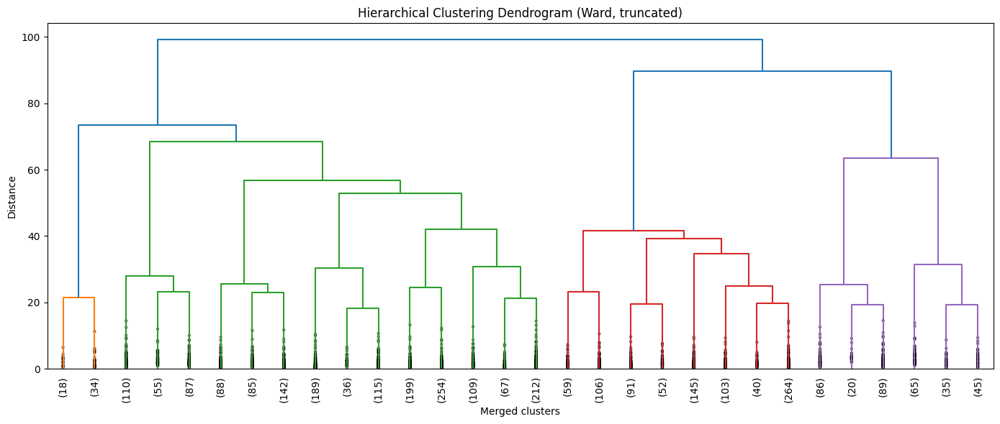

In [120]:
plt.figure(figsize=(14, 6))
dendrogram(Z,truncate_mode='lastp',p=30,leaf_rotation=90,leaf_font_size=10,show_contracted=True)

plt.title("Hierarchical Clustering Dendrogram (Ward, truncated)")
plt.xlabel("Merged clusters")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()

In [121]:
clusters = fcluster(Z, t=4, criterion='maxclust')

In [122]:
sample_df['h_cluster'] = clusters
sample_df['h_cluster'].value_counts().sort_index()


h_cluster
1      52
2    1748
3     860
4     340
Name: count, dtype: int64

In [124]:
cluster_profile = sample_df.groupby('h_cluster').agg({
    'age': 'mean',
    'weight': 'mean',
    'ap_hi': 'mean',
    'ap_lo': 'mean',
    'cholesterol': 'mean',
    'gluc': 'mean',
    'smoke': 'mean',
    'alco': 'mean',
    'active': 'mean',
    'cardio': ['mean', 'count']
})

cluster_profile


age     weight       ap_hi      ap_lo cholesterol  \
                   mean       mean        mean       mean        mean   
h_cluster                                                               
1          20602.211538  67.000000  120.576923  79.980769    0.096154   
2          20898.793478  73.466096  128.020595  82.441076    0.394737   
3          16676.420930  71.575868  122.959302  80.503488    0.177907   
4          19189.767647  76.531176  127.529412  82.235294    0.488235   

               gluc     smoke      alco    active    cardio        
               mean      mean      mean      mean      mean count  
h_cluster                                                          
1          1.096154  0.115385  0.000000  0.788462  0.480769    52  
2          1.275172  0.000572  0.000000  0.786041  0.555492  1748  
3          1.059302  0.000000  0.000000  0.830233  0.365116   860  
4          1.235294  0.811765  0.426471  0.858824  0.458824   340

### **These four hierarchical clusters reveal well-defined cardiovascular risk profiles:**

**Cluster 2:** Lowest risk, healthiest group

**Cluster 1:** Lifestyle-driven moderate risk

**Cluster 4:** Age & hypertension-driven high risk

**Cluster 3:** Metabolic syndrome-driven highest risk

This segmentation helps support targeted clinical interventions, personalized treatment plans, and improved cardiovascular risk stratification.

**4.4** t-SNE

In [127]:
tsne = TSNE(
    n_components=2,
    random_state=42,
    perplexity=30,
    max_iter=1000
)

X_embedded = tsne.fit_transform(x_train)

In [128]:
tsne_df = pd.DataFrame({
    'TSNE1': X_embedded[:,0],
    'TSNE2': X_embedded[:,1],
    'cardio': y_train.values
})

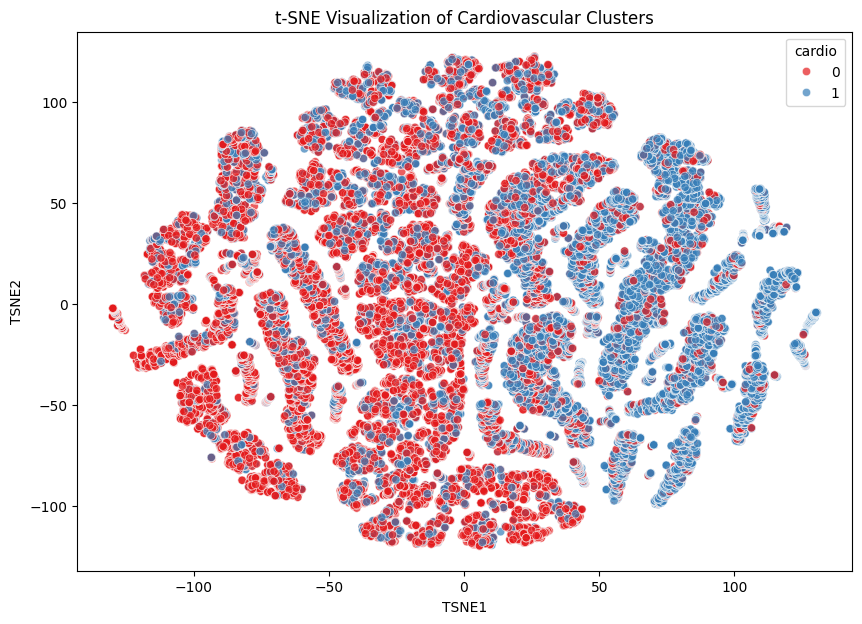

In [129]:
plt.figure(figsize=(10,7))
sns.scatterplot(
    data=tsne_df,
    x='TSNE1', y='TSNE2',
    hue='cardio',
    palette='Set1',
    alpha=0.7
)
plt.title("t-SNE Visualization of Cardiovascular Clusters")
plt.show()

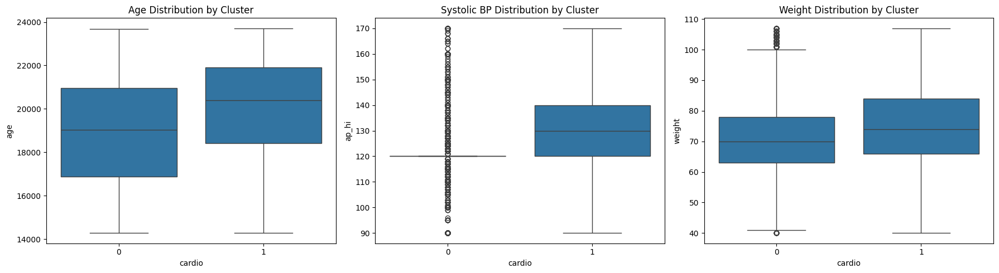

In [130]:
fig, axes = plt.subplots(1, 3, figsize=(18,5))

sns.boxplot(x='cardio', y='age', data=df, ax=axes[0])
axes[0].set_title("Age Distribution by Cluster")

sns.boxplot(x='cardio', y='ap_hi', data=df, ax=axes[1])
axes[1].set_title("Systolic BP Distribution by Cluster")

sns.boxplot(x='cardio', y='weight', data=df, ax=axes[2])
axes[2].set_title("Weight Distribution by Cluster")

plt.tight_layout()
plt.show()

Cluster prevalence (%):
cardio
0    54.201656
1    45.798344
dtype: float64


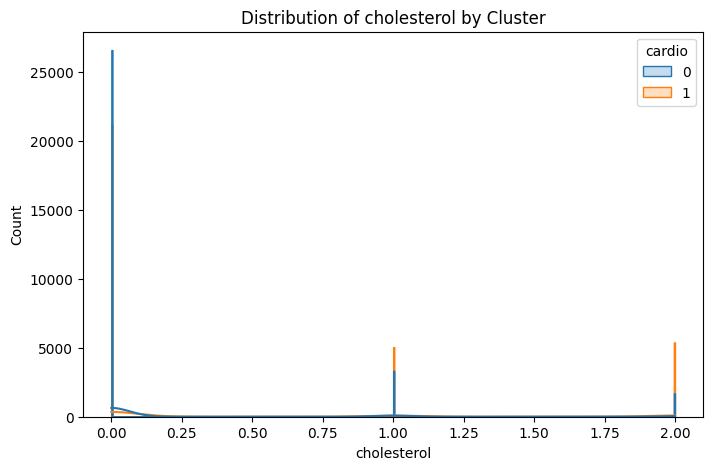

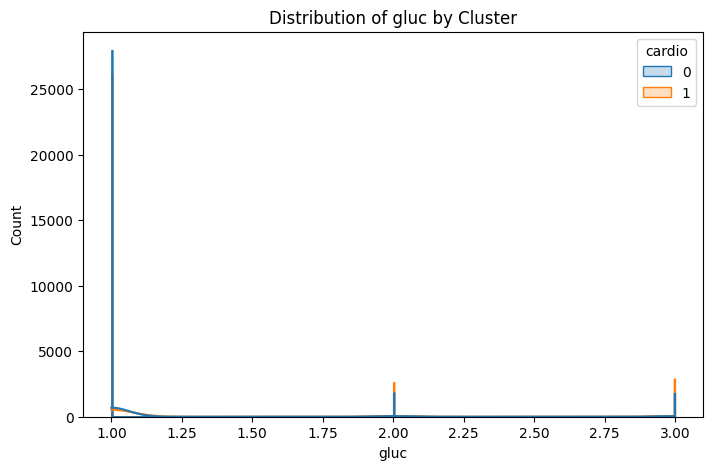

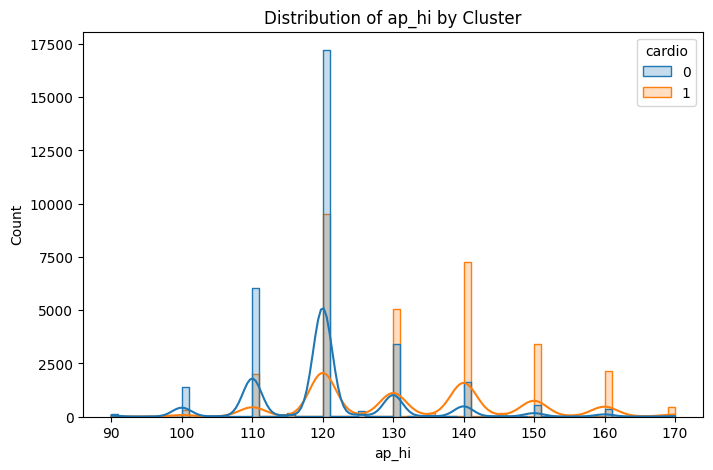

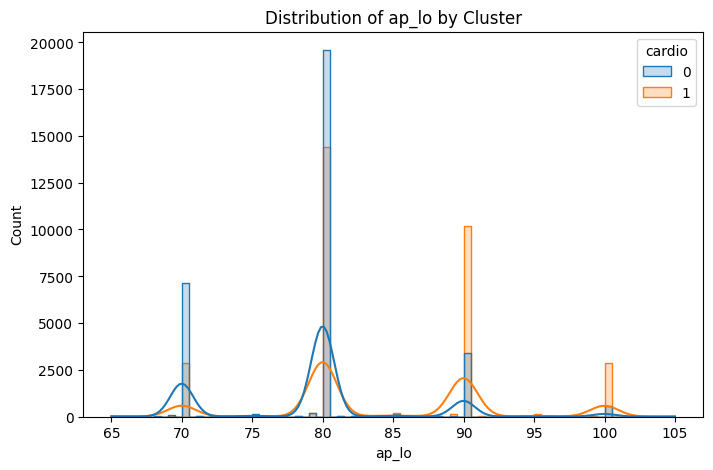

In [131]:
cluster_prevalence = tsne_df.groupby('cardio').size() / len(tsne_df) * 100
print("Cluster prevalence (%):")
print(cluster_prevalence)


for col in ['cholesterol', 'gluc', 'ap_hi', 'ap_lo']:
    plt.figure(figsize=(8,5))
    sns.histplot(data=df, x=col, hue='cardio', kde=True, element='step')
    plt.title(f"Distribution of {col} by Cluster")
    plt.show()

In [132]:
tsne
joblib.dump(tsne, "tsne_model.pkl")

['tsne_model.pkl']

## 5. Deep Learning

### 5.1 DNN classifier with 5 hidden layers





In [133]:
input_dim = x_train.shape[1]

dnn_model = Sequential([
    Dense(256, activation="relu", input_shape=(input_dim,)),
    Dense(128, activation="relu"),
    Dense(64,  activation="relu"),
    Dense(32,  activation="relu"),
    Dense(16,  activation="relu"),
    Dense(1,   activation="sigmoid")
])


In [134]:
dnn_model.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
history = dnn_model.fit(
    x_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
)

Epoch 1/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 193s 134ms/step - accuracy: 0.6973 - loss: 0.6028 - val_accuracy: 0.6758 - val_loss: 0.6005
Epoch 2/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 164s 129ms/step - accuracy: 0.7364 - loss: 0.5509 - val_accuracy: 0.6809 - val_loss: 0.5994
Epoch 3/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 165s 130ms/step - accuracy: 0.7403 - loss: 0.5481 - val_accuracy: 0.6789 - val_loss: 0.5988
Epoch 4/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 165s 130ms/step - accuracy: 0.7427 - loss: 0.5442 - val_accuracy: 0.6783 - val_loss: 0.6204
Epoch 5/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 205s 132ms/step - accuracy: 0.7435 - loss: 0.5440 - val_accuracy: 0.6585 - val_loss: 0.6170
Epoch 6/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 181s 143ms/step - accuracy: 0.7438 - loss: 0.5421 - val_accuracy: 0.6792 - val_loss: 0.5984
Epoch 7/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 167s 131ms/step - accuracy: 0.7450 - loss: 0.5412 - val_accuracy: 0.6771 - val_loss: 0.6037
Epoch 8/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 169s 133ms/step - ac

In [ ]:
dnn_model.evaluate(x_test,y_test)

396/396 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6833 - loss: 0.5877


[0.5753421187400818, 0.6806290745735168]

In [ ]:
joblib.dump(dnn_model, "dnn_model.pkl")

### 5.3 DNN classifier with 5 hidden layers


In [ ]:
df.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol',
       'gluc', 'smoke', 'alco', 'active', 'cardio', 'year', 'Cluster',
       'DBSCAN_Label'],
      dtype='object')

In [ ]:
feature_cols = [
    'age', 'gender', 'height', 'weight',
    'ap_hi', 'ap_lo', 'cholesterol', 'gluc',
    'smoke', 'alco', 'active', 'year'
]

In [ ]:
x_ae = df[feature_cols].values

In [ ]:
scaler_ae = StandardScaler()
x_ae_scaled = scaler_ae.fit_transform(x_ae)

print("X_ae_scaled shape:", x_ae_scaled.shape)

X_ae_scaled shape: (63264, 12)


In [ ]:
x_ae_train, x_ae_val = train_test_split(x_ae_scaled,test_size=0.2,random_state=42)

print("Train:", x_ae_train.shape)
print("Val  :", x_ae_val.shape)

Train: (50611, 12)
Val  : (12653, 12)


In [ ]:
input_dim = x_ae_train.shape[1]

encoding_dim = 8
latent_dim = 4

input_dim


12

In [ ]:
inputs = Input(shape=(input_dim,), name="ae_input")
x = Dense(encoding_dim, activation="relu", name="enc_dense")(inputs)
latent = Dense(latent_dim, activation="relu", name="latent_layer")(x)

In [ ]:
x_dec = Dense(encoding_dim, activation="relu", name="dec_dense")(latent)
outputs = Dense(input_dim, activation="linear", name="ae_output")(x_dec)

In [ ]:
autoencoder = Model(inputs=inputs, outputs=outputs, name="autoencoder")

In [ ]:
autoencoder.summary()

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ ae_input (InputLayer)           │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ enc_dense (Dense)               │ (None, 8)              │           104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_layer (Dense)            │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dec_dense (Dense)               │ (None, 8)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ae_output (Dense)               │ (None, 12)             │           108 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 288 (1.12 KB)

 Trainable params: 288 (1.12 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
autoencoder.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss="mse"
)

history = autoencoder.fit(
    x_ae_train, x_ae_train,
    epochs=60,
    batch_size=256,
    shuffle=True,
    validation_data=(x_ae_val, x_ae_val),
    verbose=1
)

Epoch 1/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.9594 - val_loss: 0.6776
Epoch 2/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6033 - val_loss: 0.4812
Epoch 3/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.4577 - val_loss: 0.4158
Epoch 4/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4005 - val_loss: 0.3696
Epoch 5/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3570 - val_loss: 0.3402
Epoch 6/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3312 - val_loss: 0.3114
Epoch 7/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3026 - val_loss: 0.2901
Epoch 8/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2850 - val_loss: 0.2807
Epoch 9/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2752 - val_loss: 0.2752
Epoch 10/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2699 - val_loss: 0.2710
Epoch 11/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2667 - val_loss: 0.2658
Epoch 12/60
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/ste

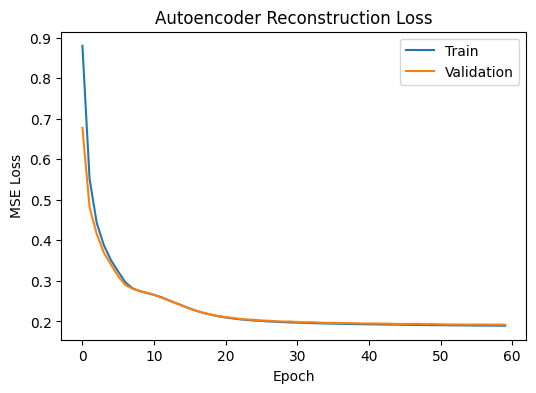

In [ ]:
plt.figure(figsize=(6,4))
plt.plot(history.history["loss"], label="Train")
plt.plot(history.history["val_loss"], label="Validation")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.title("Autoencoder Reconstruction Loss")
plt.legend()
plt.show()

In [ ]:
x_train_recon = autoencoder.predict(x_ae_train)
x_val_recon   = autoencoder.predict(x_ae_val)


train_errors = np.mean((x_ae_train - x_train_recon)**2, axis=1)
val_errors   = np.mean((x_ae_val   - x_val_recon)**2,   axis=1)

print("Train MSE:", train_errors.mean())
print("Val   MSE:", val_errors.mean())

1582/1582 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
396/396 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Train MSE: 0.18943344174920276
Val   MSE: 0.19195817378037178


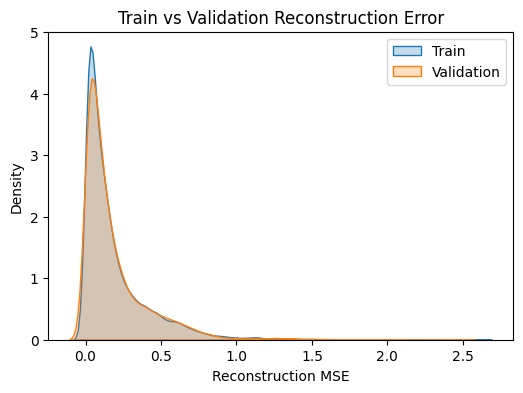

In [ ]:
plt.figure(figsize=(6,4))
sns.kdeplot(train_errors, label="Train", fill=True)
sns.kdeplot(val_errors,   label="Validation", fill=True)
plt.title("Train vs Validation Reconstruction Error")
plt.xlabel("Reconstruction MSE")
plt.ylabel("Density")
plt.legend()
plt.show()


In [ ]:
latent_layer = autoencoder.get_layer("latent_layer")

In [ ]:
encoder = Model(
    inputs=autoencoder.input,
    outputs=latent_layer.output,
    name="encoder"
)

encoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ ae_input (InputLayer)           │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ enc_dense (Dense)               │ (None, 8)              │           104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_layer (Dense)            │ (None, 4)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 140 (560.00 B)

 Trainable params: 140 (560.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
x_latent = encoder.predict(x_ae_scaled)
print(x_latent.shape)

1977/1977 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
(63264, 4)


In [ ]:
df_model = df.copy()

In [ ]:
latent_df = pd.DataFrame(
    x_latent,
    columns=["ae_feature_1", "ae_feature_2", "ae_feature_3", "ae_feature_4"]
)

df_model_ae = pd.concat(
    [df_model.reset_index(drop=True), latent_df.reset_index(drop=True)],
    axis=1
)

df_model_ae.head()


,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,year,Cluster,DBSCAN_Label,ae_feature_1,ae_feature_2,ae_feature_3,ae_feature_4
0,14485,1,160,90.0,110,70,0,1,0,0,0,0,39,2,-1,3.860218,1.603445,1.054028,4.885097
1,14453,1,159,67.0,120,80,0,1,0,0,1,0,39,2,-1,5.542095,3.867882,1.174208,5.027595
2,14339,2,170,68.0,140,90,1,2,0,0,1,0,39,2,-1,8.065777,6.521224,4.607942,4.124807
3,14393,1,160,90.0,120,80,0,1,0,0,1,0,39,2,-1,5.870257,4.285567,1.586375,5.399530
4,14463,1,157,52.0,110,70,1,2,0,0,1,0,39,2,-1,6.750023,4.974702,0.733312,3.669181


In [ ]:

joblib.dump(autoencoder, "autoencoder_model.pkl")

 **wide & deep architecture**

In [ ]:

train = df_model_ae.iloc[:split_index]
test = df_model_ae.iloc[split_index:]

target_col = 'cardio'

x_train = train.drop(columns=[target_col])
y_train = train[target_col]


x_test = test.drop(columns=[target_col])
y_test = test[target_col]

# (x, y) = df_model_ae.drop(columns=['cardio']), df_model_ae['cardio']
# x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=30)

In [ ]:
input_dim = x_train.shape[1]

wd_model = Sequential([
    Dense(256, activation="relu", input_shape=(input_dim,)),
    Dense(128, activation="relu"),
    Dense(64,  activation="relu"),
    Dense(32,  activation="relu"),
    Dense(16,  activation="relu"),
    Dense(1,   activation="sigmoid")
])

In [ ]:
wd_model.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
history = wd_model.fit(
    x_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
)

Epoch 1/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.5162 - loss: 5.9296 - val_accuracy: 0.5689 - val_loss: 3.9851
Epoch 2/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5255 - loss: 1.7450 - val_accuracy: 0.4311 - val_loss: 0.8705
Epoch 3/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.5484 - loss: 0.7165 - val_accuracy: 0.4311 - val_loss: 0.8240
Epoch 4/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5611 - loss: 0.6887 - val_accuracy: 0.4462 - val_loss: 0.6967
Epoch 5/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5683 - loss: 0.6851 - val_accuracy: 0.4310 - val_loss: 0.6982
Epoch 6/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5637 - loss: 0.6946 - val_accuracy: 0.4311 - val_loss: 0.7068
Epoch 7/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5714 - loss: 0.6832 - val_accuracy: 0.4311 - val_loss: 0.7206
Epoch 8/50
1266/1266 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5712 - loss: 0.6830 - 

In [ ]:
wd_model.evaluate(x_test,y_test)

396/396 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3751 - loss: 0.7390


[0.7511853575706482, 0.3324112892150879]

asic DNN model achieved more accuracy, while the Wide & Deep architecture achieved less.
Although Wide & Deep is theoretically more powerful

In [ ]:
joblib.dump(wd_model, "wd_model.pkl")

5-4 batch normalization

In [ ]:
input_dim = x_train.shape[1]

dnn_model = Sequential([
    Dense(256, activation="relu", input_shape=(input_dim,)),
    BatchNormalization(),
    Dropout(0.3),

    Dense(128, activation="relu"),
    BatchNormalization(),
    Dropout(0.3),

    Dense(64, activation="relu"),
    BatchNormalization(),
    Dropout(0.3),

    Dense(32, activation="relu"),
    BatchNormalization(),
    Dropout(0.3),

    Dense(16, activation="relu"),
    BatchNormalization(),
    Dropout(0.3),

    Dense(1, activation="sigmoid")
])

In [ ]:
dnn_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
history_dnn = dnn_model.fit(
    x_train, y_train,
    validation_data=(x_test, y_test),
    epochs= 10,
    batch_size=32,
    verbose=1
)

Epoch 1/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - accuracy: 0.5458 - loss: 0.7290 - val_accuracy: 0.3324 - val_loss: 1.1222
Epoch 2/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.6889 - loss: 0.6024 - val_accuracy: 0.6896 - val_loss: 0.5826
Epoch 3/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.6902 - loss: 0.5971 - val_accuracy: 0.6676 - val_loss: 0.9658
Epoch 4/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7060 - loss: 0.5841 - val_accuracy: 0.6761 - val_loss: 0.5868
Epoch 5/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7053 - loss: 0.5812 - val_accuracy: 0.6839 - val_loss: 0.5850
Epoch 6/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7103 - loss: 0.5804 - val_accuracy: 0.4292 - val_loss: 0.9860
Epoch 7/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.7041 - loss: 0.5835 - val_accuracy: 0.5270 - val_loss: 0.6976
Epoch 8/10
1582/1582 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.7084 - loss: 0.5818 

In [ ]:
dnn_model.evaluate(x_test, y_test)


396/396 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3759 - loss: 1.3313


[1.4125497341156006, 0.3329645097255707]

In [ ]:

dnn_model.save("dnn_model.h5")
joblib.dump(dnn_model, "dnn_model.pkl")

5-5 Compare